# Capstone Two: 
Seoul Bike Share Program

In [1]:
import pandas as pd

In [2]:
# the supplied CSV data file is in the raw_data directory
bike_data = pd.read_csv('../raw_data/SeoulBikeData.csv', encoding = "ISO-8859-1")

In [3]:
# Looking for missing values
missing = pd.concat([bike_data.isnull().sum(), 100 * bike_data.isnull().mean()],axis = 1)
missing.columns=['count', '%']
missing = missing.sort_values(by='count')
missing

,count,%
Date,0,0.0
Rented Bike Count,0,0.0
Hour,0,0.0
Temperature(°C),0,0.0
Humidity(%),0,0.0
Wind speed (m/s),0,0.0
Visibility (10m),0,0.0
Dew point temperature(°C),0,0.0
Solar Radiation (MJ/m2),0,0.0
Rainfall(mm),0,0.0


In [4]:
bike_data.select_dtypes('object')

,Date,Seasons,Holiday,Functioning Day
0,01/12/2017,Winter,No Holiday,Yes
1,01/12/2017,Winter,No Holiday,Yes
2,01/12/2017,Winter,No Holiday,Yes
3,01/12/2017,Winter,No Holiday,Yes
4,01/12/2017,Winter,No Holiday,Yes
...,...,...,...,...
8755,30/11/2018,Autumn,No Holiday,Yes
8756,30/11/2018,Autumn,No Holiday,Yes
8757,30/11/2018,Autumn,No Holiday,Yes
8758,30/11/2018,Autumn,No Holiday,Yes


In [5]:
bike_data.tail().transpose()

,8755,8756,8757,8758,8759
Date,30/11/2018,30/11/2018,30/11/2018,30/11/2018,30/11/2018
Rented Bike Count,1003,764,694,712,584
Hour,19,20,21,22,23
Temperature(°C),4.2,3.4,2.6,2.1,1.9
Humidity(%),34,37,39,41,43
Wind speed (m/s),2.6,2.3,0.3,1,1.3
Visibility (10m),1894,2000,1968,1859,1909
Dew point temperature(°C),-10.3,-9.9,-9.9,-9.8,-9.3
Solar Radiation (MJ/m2),0,0,0,0,0
Rainfall(mm),0,0,0,0,0


In [6]:
from pandas_profiling import ProfileReport

In [8]:
print(bike_data.dtypes)

Date                          object
Rented Bike Count              int64
Hour                           int64
Temperature(°C)              float64
Humidity(%)                    int64
Wind speed (m/s)             float64
Visibility (10m)               int64
Dew point temperature(°C)    float64
Solar Radiation (MJ/m2)      float64
Rainfall(mm)                 float64
Snowfall (cm)                float64
Seasons                       object
Holiday                       object
Functioning Day               object
dtype: object


In [11]:
df = pd.DataFrame(bike_data)

In [13]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [14]:
profile.to_widgets()
profile.to_notebook_iframe()

In [15]:
# Invoke OneHotEncoder for 'Seasons'
# Reference website: https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/
from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
# define example
#data = ['cold', 'cold', 'warm', 'cold', 'hot', 'hot', 'warm', 'cold', 'warm', 'hot']
seasons_data = bike_data['Seasons']
values = array(seasons_data)
#print(values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
#print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded_seasons = onehot_encoder.fit_transform(integer_encoded)
onehotE_seasons = pd.DataFrame(onehot_encoded_seasons, columns = ['Season0', 'Season1', 'Season2', 'Season3' ])
#print(onehotE_seasons) #Seasons column transformed into one hot encoded values

# invert first example
#inverted = label_encoder.inverse_transform([argmax(onehot_encoded[0, :])])
#print(inverted)

In [16]:
# Invoke OneHotEncoder for 'Holiday'
# Reference website: https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/
from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
# define example
#data = ['cold', 'cold', 'warm', 'cold', 'hot', 'hot', 'warm', 'cold', 'warm', 'hot']
holiday_data = bike_data['Holiday']
values = array(holiday_data)
#print(values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
#print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded_holiday = onehot_encoder.fit_transform(integer_encoded)
onehotE_holiday = pd.DataFrame(onehot_encoded_holiday, columns = ['Holiday0', 'Holiday1'])
#print(onehotE_holiday)    #Holiday column transformed into one hot encoded values
# invert first example
#inverted = label_encoder.inverse_transform([argmax(onehot_encoded[0, :])])
#print(inverted)

In [17]:
# Invoke OneHotEncoder for 'Functioning Day'
# Reference website: https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/
from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
# define example
#data = ['cold', 'cold', 'warm', 'cold', 'hot', 'hot', 'warm', 'cold', 'warm', 'hot']
functioning_day_data = bike_data['Functioning Day']
values = array(functioning_day_data)
#print(values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
#print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded_func_day = onehot_encoder.fit_transform(integer_encoded)
#print(onehot_encoded_func_day)     #Functioning Day column transformed into one hot encoded values
onehotE_funcday = pd.DataFrame(onehot_encoded_func_day, columns = ['FunctioningDay0', 'FunctioningDay1'])

#print(onehotE_funcday)
# invert first example
#inverted = label_encoder.inverse_transform([argmax(onehot_encoded[0, :])])
#print(inverted)

# Comments: 
The raw data had no missing values, no duplicated values. I used one hot encoder on two categorical
variables ('Seasons,' 'Holiday'), and one boolean-valued variable ('Functioning Day'). Still need to transform 
'Date' data, 'Hour' data into Datetime data and fold transformed data into the raw data (bike_data).

In [18]:
from datetime import datetime

In [19]:
#creates a function takes an input and converts it to specific datetime format
def fixTime(daily):
     return datetime.strptime(daily, '%d/%m/%Y %H')

#Join the Date and Hour columns
date_dt = bike_data[['Date']].join(bike_data[['Hour']])
#Recast the Date and Hour columns as one column called Time
date_dt['Time'] = date_dt[date_dt.columns[0:]].apply(lambda x: ' '.join(x.dropna().astype(str)), axis=1)
#This line uses pandas map functionality.  It sends each cell in the Time column to the function 
#we made above and then overwrites the original value.
date_dt['Time'] = date_dt.Time.map(fixTime)

# Get a fresh copy of the raw_data, join to the datetime 'Time' column and drop 'Date' and 'Hour' columns
new_data2 = pd.read_csv('../raw_data/SeoulBikeData.csv', encoding = "ISO-8859-1")
df2 = pd.DataFrame(new_data2)
bike_share2 = df2.join(date_dt['Time'])

print(bike_share2['Time'].dtypes)

bike_share = bike_share2.drop(['Date'], axis = 1)
bike_share = bike_share.drop(['Hour'], axis = 1)

# Need to fold in one hot encoder columns:
bike_share = bike_share.join(onehotE_funcday)
bike_share = bike_share.join(onehotE_holiday)
bike_share = bike_share.join(onehotE_seasons)
bike_share = bike_share.drop(['Seasons'], axis = 1)
bike_share = bike_share.drop(['Functioning Day'], axis = 1)
bike_share = bike_share.drop(['Holiday'], axis = 1)

#bike_share.set_index('Time', inplace = True)
#print(bike_share.head(3))
bike = pd.DataFrame(bike_share)
print(bike.head(3))

datetime64[ns]
   Rented Bike Count  Temperature(°C)  Humidity(%)  Wind speed (m/s)  \
0                254             -5.2           37               2.2   
1                204             -5.5           38               0.8   
2                173             -6.0           39               1.0   

   Visibility (10m)  Dew point temperature(°C)  Solar Radiation (MJ/m2)  \
0              2000                      -17.6                      0.0   
1              2000                      -17.6                      0.0   
2              2000                      -17.7                      0.0   

   Rainfall(mm)  Snowfall (cm)                Time  FunctioningDay0  \
0           0.0            0.0 2017-12-01 00:00:00              0.0   
1           0.0            0.0 2017-12-01 01:00:00              0.0   
2           0.0            0.0 2017-12-01 02:00:00              0.0   

   FunctioningDay1  Holiday0  Holiday1  Season0  Season1  Season2  Season3  
0              1.0       0.0     

In [27]:
# Convert 'Time' to 'Epoch Time'
import time

df = bike[['Time']].copy()

# convert 'Time' to datetime
df['Time'] = pd.to_datetime(df['Time'])

date_time = df.Time.to_list()
#date_time = '29.08.2011 11:05:02'
pattern = '%Y-%m-%d %H:%M:%S'
epoch = [int(time.mktime(time.strptime(str(item), pattern))) for item in date_time]
#epoch = int(time.mktime(time.strptime(date_time, pattern)))

# Drop 'Time' column. Append 'Epoch Time' to 'bike' data
df['Epoch Time'] = pd.DataFrame(epoch)
df = df.drop('Time', axis=1)
#bike.insert(0, "Epoch Time", df['Epoch Time'], True)
#bike = bike.drop('Epoch Time', axis=1)
print(bike.head(2))

   Epoch Time  Rented Bike Count  Temperature(°C)  Humidity(%)  \
0  1512115200                254             -5.2           37   
1  1512118800                204             -5.5           38   

   Wind speed (m/s)  Visibility (10m)  Dew point temperature(°C)  \
0               2.2              2000                      -17.6   
1               0.8              2000                      -17.6   

   Solar Radiation (MJ/m2)  Rainfall(mm)  Snowfall (cm)                Time  \
0                      0.0           0.0            0.0 2017-12-01 00:00:00   
1                      0.0           0.0            0.0 2017-12-01 01:00:00   

   FunctioningDay0  FunctioningDay1  Holiday0  Holiday1  Season0  Season1  \
0                0                1         0         1      0.0      0.0   
1                0                1         0         1      0.0      0.0   

   Season2  Season3  
0      0.0      1.0  
1      0.0      1.0  


In [28]:
import numpy as np
# Decided to drop Seasons columns.
#bike = bike.drop(['Season0'], axis = 1)
#bike = bike.drop(['Season1'], axis = 1)
#bike = bike.drop(['Season2'], axis = 1)
#bike = bike.drop(['Season3'], axis = 1)
bike['FunctioningDay0'] = bike['FunctioningDay0'].astype('int64')
bike['FunctioningDay1'] = bike['FunctioningDay1'].astype('int64')
bike['Holiday0'] = bike['Holiday0'].astype('int64')
bike['Holiday1'] = bike['Holiday1'].astype('int64')
bike['Epoch Time'] = bike['Epoch Time'].astype('float')

In [29]:
# Redo Pandas Profiling with the one hot encoding numbers
profile = ProfileReport(bike, title='Pandas Profiling Report', explorative=True)
profile.to_widgets()
profile.to_notebook_iframe()

In [30]:
# Split the data into train_data and test_data
from sklearn.model_selection import train_test_split
y = bike[['Rented Bike Count']]
X = bike.drop(['Rented Bike Count'], axis=1)

features = ['Epoch Time','Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
       'FunctioningDay0', 'FunctioningDay1', 'Holiday0', 'Holiday1']
rows = X.index

y1 = pd.DataFrame(y, columns=['Rented Bike Count'], index=X.index)
X1 = pd.DataFrame(X, columns=features, index=X.index)
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=.20, random_state=42)

row1 = X_train.index
column1 = X_train.columns
row2 = X_test.index
column2 = X_test.columns

# Standard scaler -- scale the numeric variables
from sklearn.preprocessing import StandardScaler
import numpy as np

# Instantiate StandardScaler
scaler = StandardScaler()

# Fit only to the training data
X_train = scaler.fit_transform(X_train)

# Now apply the transformations to the data:
X_test = scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train, index=row1, columns=column1)
X_test_scaled = pd.DataFrame(X_test, index=row2, columns=column2)

#from sklearn.preprocessing import StandardScaler
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform (X_test)

In [31]:
# Scale y_train, y_test
y_train_scaled = (y_train - np.mean(y_train))/np.std(y_train, ddof=0)
y_test_scaled = (y_test - np.mean(y_test))/np.std(y_test, ddof=0)

In [32]:
# save the data to new csv files
X_train_scaled.to_csv('X_train.csv')
X_test_scaled.to_csv('X_test.csv')
y_train_scaled.to_csv('y_train.csv')
y_test_scaled.to_csv('y_test.csv')

In [33]:
print(X_train_scaled.head(4))

      Epoch Time  Temperature(°C)  Humidity(%)  Wind speed (m/s)  \
8415    1.596577         0.022370     0.137012          2.092940   
5049    0.262704         0.838222     1.359982         -0.029683   
8395    1.588654        -0.145847    -0.596770         -0.319131   
1535   -1.129009        -1.306543     0.528362          0.259766   

      Visibility (10m)  Dew point temperature(°C)  Solar Radiation (MJ/m2)  \
8415         -1.176113                   0.130553                 0.519701   
5049         -1.472667                   1.255469                 0.210677   
8395         -0.930350                  -0.316331                -0.659168   
1535         -0.004643                  -0.894198                -0.659168   

      Rainfall(mm)  Snowfall (cm)  FunctioningDay0  FunctioningDay1  Holiday0  \
8415     -0.134019      -0.171026        -0.187089         0.187089 -0.229967   
5049     -0.134019      -0.171026        -0.187089         0.187089 -0.229967   
8395     -0.134019      -

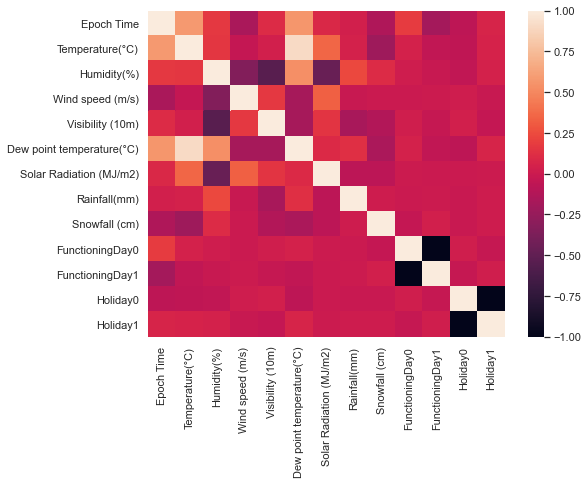

In [50]:
import numpy as np; #np.random.seed(47)
import seaborn as sns
import matplotlib.pyplot as plt

#Show a seaborn heatmap of correlations in X_train
plt.subplots(figsize=(8,6))
sns.heatmap(X1.corr());